In [1]:
import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
import yfinance as yf

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use('bmh') 
plt.rcParams['figure.figsize'] = [16,9]
plt.rcParams['figure.dpi'] = 300

import warnings
warnings.filterwarnings('ignore')

# Modelagem de Séries Temporais

## Decompondo séries temporais

O intuito em decompor séries temporais é aumentar nossos entendimento sobre os dados através da quebra de componentes da série, a fim de nos guiar em qual tipo de abordagem seguir na modelagem.
Os componentes basicamente podem ser sistemáticos ou não-sistemáticos. Os sistemáticos podem ser modelados e descritos, enquanto os não-sistemáticos não podem ser modelados diretamente.

Os **componentes sistemáticos** são:
   - nível: é a média da série
   - tendência: representa a alteração de valor entre dois tempos distintos e está relacionada à inclinação da curva
   - sazonalidade: são desvios da médias causado em intervalos de tempo repetidos
     
O **componente não sistemático** é:
   - ruído:a variação aleatória presente na série.
    
Há duas formas de decompor a série temporal: aditiva e multiplicativa:

As características da **decomposição aditiva** são:
   - Modelo na forma: 
$$ y(t) = nível + tendência + sazonalidade + ruído; $$

   - Modelo linear: mudanças ao longo do tempo são constantes em tamanho;
   - A tendência é linear (linha reta);
   - A sazonalidade é também linear com mesma frequência (espaçamento) e amplitude (altura) dos ciclos ao longo do tempo;
    
As características da **decomposição multiplicativa** são:
   - Modelo na forma: 
$$ y(t) = nível * tendência * sazonalidade * ruído; $$
   - Modelo não linear: mudanças ao longo do tempo não são constantes em tamanho, por exemplo, exponencial;
   - A tendência é curviínea;
   - A sazonalidade é não-linear com aumento/redução da frequência e amplitude dos ciclos ao longo do tempo;


Pode ocorrer de não queremos trabalhar com decomposição multiplicativa e nisso podemos aplicar algumas transformações para trabalhar com essa série e transformá-la de modo que sua tendência/sazonalidade seja linear, como é o caso de séries exponenciais em que podemos aplicar a transformação logarítimica.


Abaixo trabalharemos com a decomposição da série temporal referente aos preços de ouro 

In [2]:
import quandl

QUANDL_KEY = 'n82HGKMyq5xHHriyK6wE'
quandl.ApiConfig.api_key = QUANDL_KEY

df = quandl.get(dataset = 'WGC/GOLD_MONAVG_USD',
                      start_date = '2000-01-01',
                      end_date = '2011-12-31')
df.head()

,Value
Date,
2000-01-31,284.31
2000-02-29,299.86
2000-03-31,286.39
2000-04-28,279.69
2000-04-30,279.69


In [3]:
df.rename(columns = {'Value': 'price'}, inplace = True)
df = df.resample('M').last() #observamos alguns casos duplicados no mês, dessa forma fazemos o resample e mantemos uma obs

print(f'Shape do DataFrame: {df.shape}')
df.head()

Shape do DataFrame: (144, 1)


,price
Date,
2000-01-31,284.31
2000-02-29,299.86
2000-03-31,286.39
2000-04-30,279.69
2000-05-31,275.19


Adicionando média móvel e volatilidade móvel

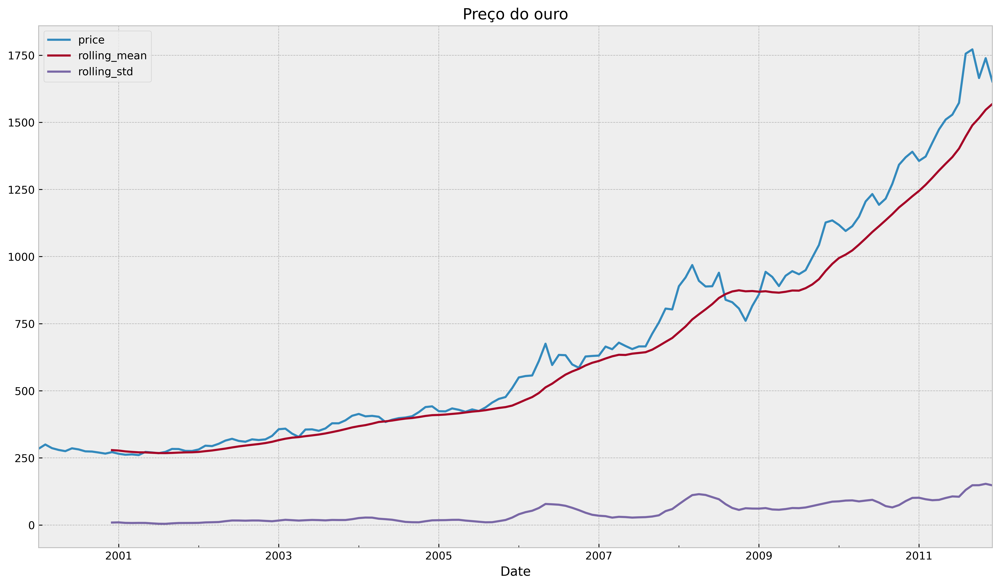

In [4]:
WINDOW_SIZE = 12
df['rolling_mean'] = df['price'].rolling(window = WINDOW_SIZE).mean()
df['rolling_std'] = df['price'].rolling(window = WINDOW_SIZE).std()

df.plot(title = 'Preço do ouro')
plt.show()

Decompondo usando o método multiplicativo: Do gráfico acima, observamos que a média móvel apresenta um crescimento não linear e que a o desvio padrão móvel é crescente ao longo do tempo e por esses motivos, escolhemos usar o método múltiplicativo

In [19]:
decomposition_results = seasonal_decompose(df.price, model='multiplicative')

decomposition_results.plot().suptitle('Decomposição multiplicativa',x = 0.18,y = 1,  fontsize = 20)
plt.show()

Na decomposição acima conseguimos ver os componentes tendência,  sazonalidade e ruído. Para checar se a decomposição faz sentido, olhamos o ruído: Se não há nenhum padrão discernível(isto é, se o ruído for de fato aleatório), então o ajuste faz sentido, por exemplo, se tivéssemos aplicado o método aditivo, haveria um padrão de crescimento do ruído ao longo do tempo, nos mostrando que haveria um aumento da variância na segunda parte do dataset:

In [18]:
decomposition_result_add = seasonal_decompose(df.price, model='additive')

decomposition_result_add.plot().suptitle('Decomposição aditiva',x = 0.18,y = 1,  fontsize = 20)
plt.show()

## Decompondo Séries Temporais com Facebook's Prophet

Uma abordagem diferente para a decomposição de séries temporais é usar um modelo aditivo no qual a série é representada como uma combinação de padrões em diferentes escalas de tempo (diária, semanal, mensal, anual) unidas com a tendência geral. o uso do Facebook's Prophet faz exatamente isso com algumas outras funcionalidades como contagem de pontos de inflexão (mudança rápida de comportamento na série), feriados e outras coisas. Outro benefício é que ela realiza previsões de valores futuros com um intervalo de confiança indicando o nível de incerteza.

O Prophet foi criado para analisar principalmente séries de observações diárias que exibam padrões em diferentes escalas de tempo. Nela precisamos indicar a escala temporal como 'ds' e a variável target como 'y'.

Abaixo usamos o modelo aditivo do Prophet nos preços diários de 2000-2004 e prevendo os preços para 2005

In [43]:
from fbprophet import Prophet

df = quandl.get(dataset='WGC/GOLD_DAILY_USD',
                start_date='2000-01-01',
                end_date='2005-12-31')

df.reset_index(drop = False, inplace = True)
df.rename(columns = {'Date': 'ds', 'Value': 'y'}, inplace = True)
df.head()

,ds,y
0,2000-01-03,290.25
1,2000-01-04,281.50
2,2000-01-05,280.45
3,2000-01-06,279.40
4,2000-01-07,282.10


Quebramos a série entre treino e teste

In [44]:
train_indices = df.ds.apply(lambda x: x.year) < 2005
df_train = df.loc[train_indices].dropna()
df_test = df.loc[~train_indices].reset_index(drop = True)

Criando a instancia do modelo e fitando ele

In [45]:
model_prophet = Prophet(seasonality_mode='additive') #adicionando a sazonalidade mensal
model_prophet.add_seasonality(name='monthly', period=30.5, fourier_order=5)
model_prophet.fit(df_train)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Prevendo o preço do ouro 1 ano pra frente e plotando os resultados:

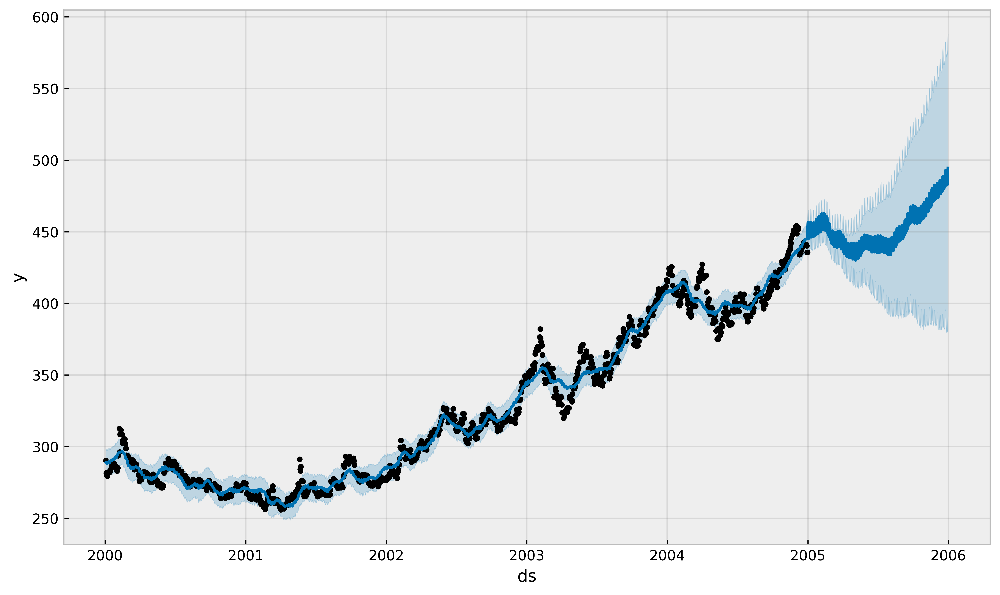

In [46]:
df_future = model_prophet.make_future_dataframe(periods = 365)
df_pred = model_prophet.predict(df_future)
model_prophet.plot(df_pred)

plt.show()

Inspecionando a decomposição da série

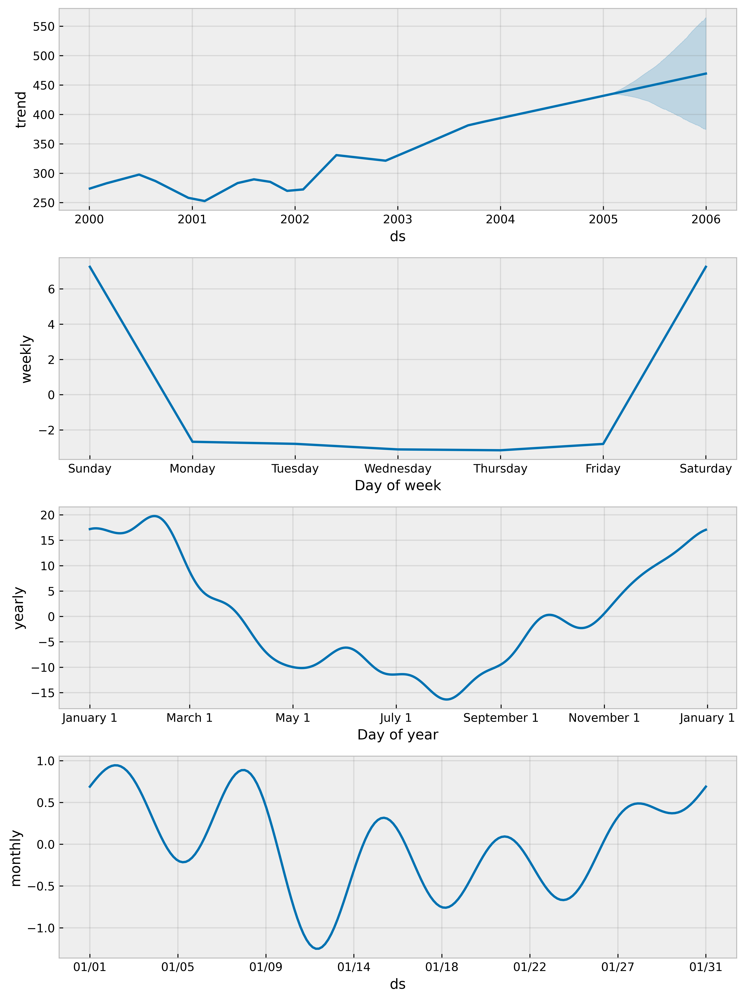

In [31]:
model_prophet.plot_components(df_pred)
plt.show()

Analisando as tendencias, podemos assumir que há uma tendência de aumento do preço do outro ao longo do ano e que ela varia intra ano mostrando altas no começo/fim de cada ano e queda no meio do ano. Durante o mês há um movimento não tão claro. Durante a semana as mudanças são nulas (desconsidere os fins de semana, já que não há marcação de preço nesses dias). Concluimos que com a diminuição da escala temporal, o ruído varre o sinal e por isso, podemos desativar por completo o nível semanal.

Comparando o predito com o real

In [47]:
selected_columns = ['ds', 'yhat_lower', 'yhat_upper', 'yhat']

df_pred = df_pred.loc[:, selected_columns].reset_index(drop = True)
df_test = df_test.merge(df_pred, on = ['ds'], how = 'left')
df_test.ds = pd.to_datetime(df_test.ds)
df_test.set_index('ds', inplace = True)
df_test.head()

,y,yhat_lower,yhat_upper,yhat
ds,,,,
2005-01-03,435.60,436.118162,454.317126,445.316001
2005-01-04,427.75,436.902159,454.485394,445.501884
2005-01-05,426.00,437.262553,455.804930,445.973248
2005-01-06,424.35,437.810352,455.309137,446.590789
2005-01-07,422.20,438.427595,456.560832,447.038339


Plotando os valores preditos com os reais

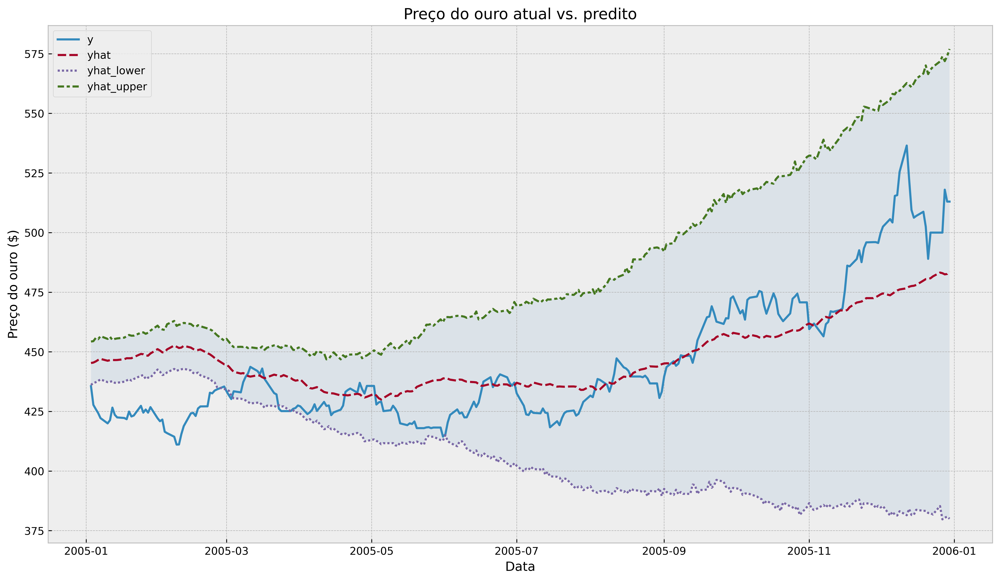

In [54]:
fig, ax = plt.subplots(1,1)

ax = sns.lineplot(data = df_test[['y', 'yhat', 'yhat_lower', 'yhat_upper']])
ax.fill_between(df_test.index,
                df_test.yhat_upper,
                df_test.yhat_lower, 
                alpha = 0.1)
ax.set(title = 'Preço do ouro atual vs. predito',
      xlabel = 'Data',
      ylabel = 'Preço do ouro ($)')
plt.show()

No geral, o prophet previu corretamente o preço do ouro ao longo de 2005, porém com os dois primeiros meses do ano fora do intervalo de confiança

## Testando estacionariedade de séries temporais

Uma série de tempo estacionária é aquela em que suas propriedades estatísticas como média, variância e covariância são constantes ao longo do tempo. Estacionariedade é uma característica desejada em séries temporais já que torna mais fácil o trabalho de modelagem e previsão. Algumas  desvantagens de dados não estacionários são:
 - A variância pode ser especificada incorretamente pelo modelo;
 - Um ajuste pior do modelo;
 - Padrões valiosos dependentes do tempo não são aproveitados.
 
Abaixo testamos a estacionariedade das séries através:
 - **ADF**: O teste Augmented Dickey-Fuller;
 - **KPSS**: O teste Kwiatkowski-Phillips-Schmidt-Shin;
 - **PACF/ACF**: O plot das funções de autocorrelação e autocorrelação parcial;
 
Para isso usaremos os dados mensais dos preços de outro entre os anos 2000-2011. Já vimos que as estatísticas dessas séries nos indicam não estacionariedade, já que pelo média móvel e volatilidade móvel notamos um aumento ao longo do tempo.

In [55]:
df = quandl.get(dataset='WGC/GOLD_MONAVG_USD',
                start_date='2000-01-01', 
                end_date='2011-12-31')
df.head()

,Value
Date,
2000-01-31,284.31
2000-02-29,299.86
2000-03-31,286.39
2000-04-28,279.69
2000-04-30,279.69


In [56]:
df.rename(columns = {'Value':'price'}, inplace = True)
df = df.resample('M').last()

In [58]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss

Definimos a função que rodará o teste ADF:

In [102]:
def adf_test(x):
    '''
    Função para performar o teste Augmented Dickey-Fuller de estacionariedade
    
    H0: Série temporal é não-estacionária;
    HA: Série temporal é estacionária;
    
    Parâmetros:
    -----------
    x: pd.Series / np.array
       A série temporal a ser checada
    '''
    
    indices = ['Test Statistic',
               'p-value',
               '# de lags usados',
               '# de observações usadas']
    adf_test = adfuller(x, autolag = 'AIC')
    results = pd.Series(adf_test[0:4], index = indices)
    
    for key, value in adf_test[4].items():
        results[f' Valor crítico ({key})'] = value
        
    return results

In [78]:
adf_test(df.price)

,Valores
Test Statistic,3.510499
p-value,1.000000
# de lags usados,14.000000
# de observações usadas,129.000000
Valor crítico (1%),-3.482088
Valor crítico (5%),-2.884219
Valor crítico (10%),-2.578864


Como a H0 é que a série é não estacionária e o p-valor é muito maior que os limites 0.01, 0.05 ou 0.1, não há motivos para rejeitarmos H0, dessa forma concluimos que a série não é estacionária

Definindo a função para rodar o teste KPSS

In [101]:
def kpss_test(x, h0_type='c'):
    '''
    Função para performar o teste de estacionariedade Kwiatkowski-Phillips-Schmidt-Shin
    
    H0: Série temporal é estacionária;
    HA: Série temporal é não-estacionária;

    Parâmetros:
    -----------
    x: pd.Series / np.array
       A série temporal a ser checada
    h0_type: str{'c', 'ct'}
        Indica a hipótese nula do teste  KPSS
            * 'c': Os dados são estacionário ao redor de uma constante
            * 'ct': Os dados são estacionário ao redor de uma tendência
    
    '''
    
    indices = ['Test Statistic', 'p-value', '# de Lags']

    kpss_test = kpss(x, regression=h0_type)
    results = pd.Series(kpss_test[0:3], index=indices)
    
    for key, value in kpss_test[3].items():
        results[f'Valor Crítico ({key})'] = value

    return results

In [82]:
kpss_test(df.price)

,Valores
Test Statistic,0.985671
p-value,0.010000
# de Lags,14.000000
Valor Crítico (10%),0.347000
Valor Crítico (5%),0.463000
Valor Crítico (2.5%),0.574000
Valor Crítico (1%),0.739000


Como a hipótese nula do teste KPSS é de que a série é estacionária e o p-valor sendo 0.01 ou estatistica de teste > que os valores criticos, temos indicativos que podemos rejeitar H0, logo a série é não-estacionária

Gerando plots ACF/PACF:

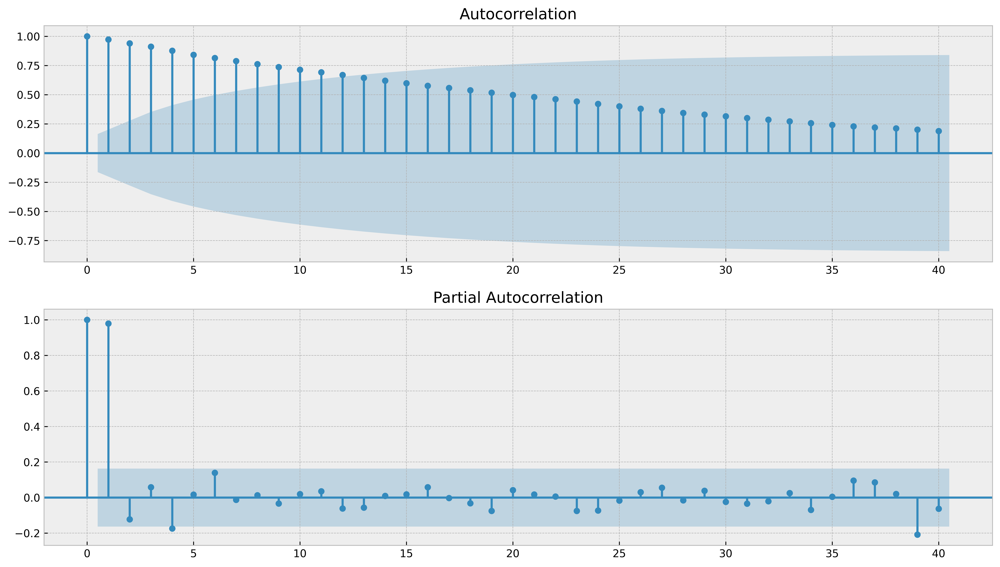

In [83]:
N_LAGS = 40
SIGNIFICANCE_LEVEL = 0.05

fig, ax = plt.subplots(2, 1)
plot_acf(df.price, ax=ax[0], lags=N_LAGS, 
         alpha=SIGNIFICANCE_LEVEL)
plot_pacf(df.price, ax=ax[1], lags=N_LAGS, 
          alpha=SIGNIFICANCE_LEVEL)

plt.show()

No plot ACF podemos ver que há autocorrelação significativa (acima do intervalo de confiança de 95%) e ainda podemos ver uma autocorrelação significante no lag1 da PACF

## Corrigindo a estacionariedade em séries de tempo

Nessa etapa fazemos as transformações de séries não estacionárias em estacionárias usando as seguintes transformações: 
 - Delação: Contabilizando a inflação em séries monetárias usando o índice de consumo de preço (CPI)
 - Log normal: Fazendo uma tendência exponencial tender a uma linear
 - Diferenciação: Tirando a diferença entre a observação atual e o seu valor lagado

In [84]:
df = quandl.get(dataset='WGC/GOLD_MONAVG_USD',
                start_date='2000-01-01', 
                end_date='2011-12-31')

df.rename(columns={'Value': 'price'}, inplace=True)
df = df.resample('M').last()

In [88]:
import cpi
from datetime import date
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss

In [110]:
def test_autocorrelation(x, n_lags=40, alpha=0.05, h0_type='c'):
    '''
    Função para testar estacionariedade de uma série usando :
    * ADF test
    * KPSS test
    * ACF/PACF plots
    
    Parâmetros
    ----------
    x: pd.Series / np.array
        A série ser analisada
    n_lags : int
        Número de lags usadas na ACF/PACF plots
    alpha : float
        Nível de significância da ACF/PACF plots
    h0_type: str{'c', 'ct'}
        Indica a hipótese nula do KPSS test
            * 'c': O dado é estacionário ao redor de uma constante
            * 'ct': O dado é estacionário ao redor de uma tendencia
    '''

    adf_results = adf_test(x)
    kpss_results = kpss_test(x, h0_type=h0_type)

    print('ADF test statistic: {:.2f} (p-val: {:.2f})'.format(adf_results['Test Statistic'], adf_results['p-value']))
    print('KPSS test statistic: {:.2f} (p-val: {:.2f})'.format(kpss_results['Test Statistic'],
                                                              kpss_results['p-value']))

    fig, ax = plt.subplots(2, figsize=(16, 8))
    plot_acf(x, ax=ax[0], lags=n_lags, alpha=alpha)
    plot_pacf(x, ax=ax[1], lags=n_lags, alpha=alpha)

    return fig

Deflacionando a série de preço do ouro e plotando os resultados:

In [93]:
df

,price
Date,
2000-01-31,284.31
2000-02-29,299.86
2000-03-31,286.39
2000-04-30,279.69
2000-05-31,275.19
...,...
2011-08-31,1755.81
2011-09-30,1771.85
2011-10-31,1665.21


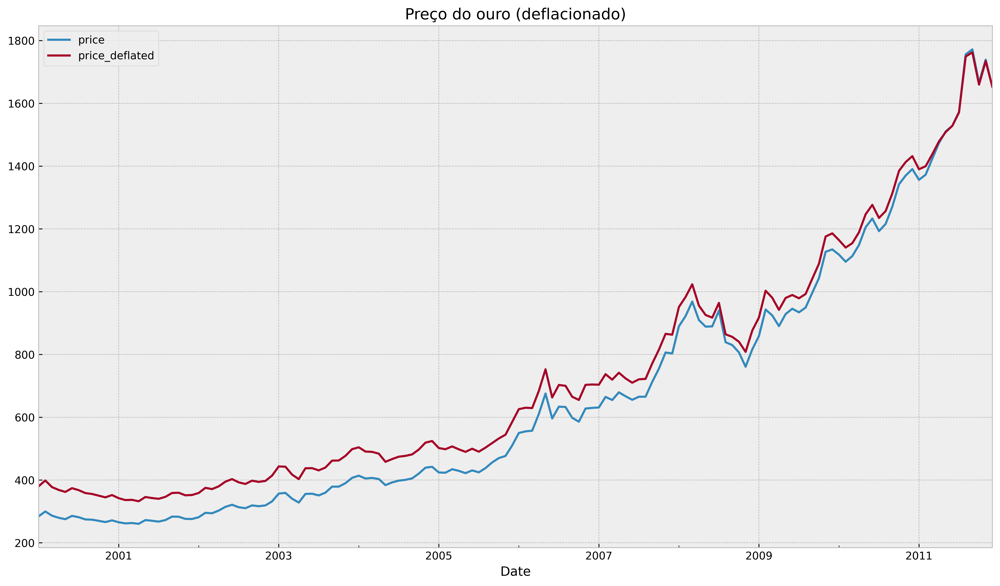

In [96]:
DEFL_DATE = date(2011,12,31)
df['dt_index'] = df.index.map(lambda x: x.to_pydatetime().date())
df['price_deflated'] = df.apply(lambda x: cpi.inflate(x.price, x.dt_index, DEFL_DATE), axis = 1)

df[['price', 'price_deflated']].plot(title = 'Preço do ouro (deflacionado)')
plt.show()

Deflacionando a série usando logaritmo natural

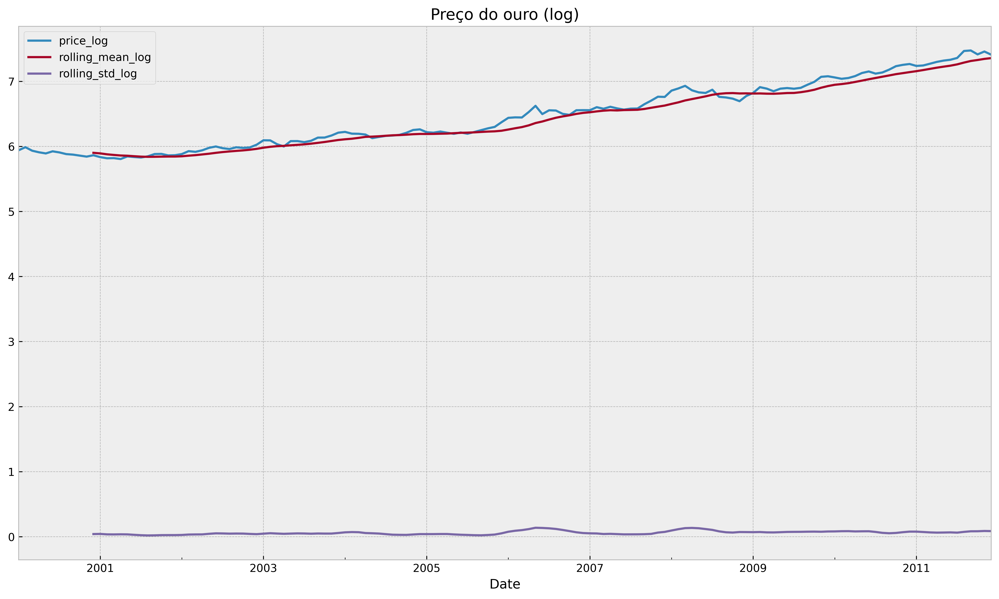

In [97]:
WINDOW = 12
selected_columns = ['price_log', 'rolling_mean_log', 'rolling_std_log']

df['price_log'] = np.log(df.price_deflated)
df['rolling_mean_log'] = df.price_log.rolling(window = WINDOW).mean()
df['rolling_std_log'] = df.price_log.rolling(window = WINDOW).std()

df[selected_columns].plot(title = 'Preço do ouro (log)')

plt.show()

Usando o teste de correlação para checar se a série se tornou estacionária

ADF test statistic: 0.89 (p-val: 0.99)
KPSS test statistic: 1.04 (p-val: 0.01)


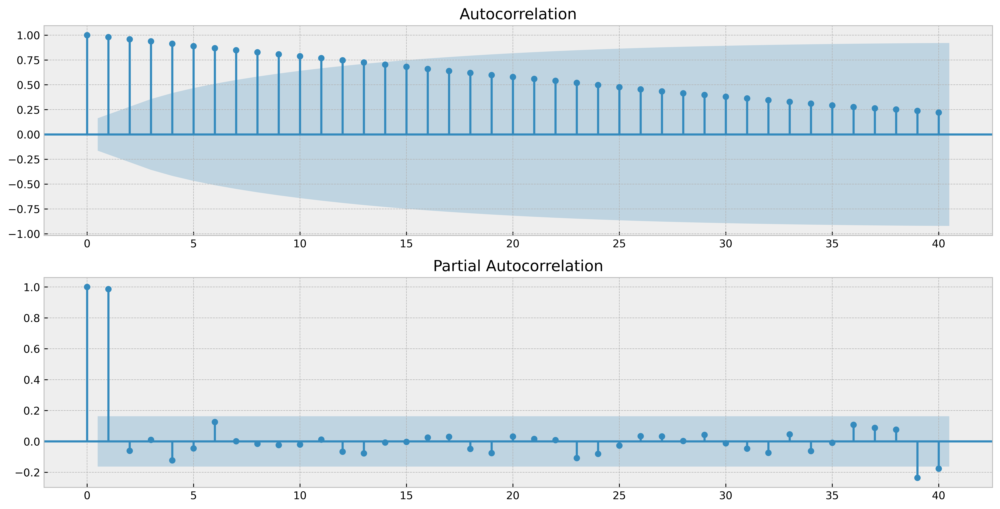

In [111]:
fig = test_autocorrelation(df.price_log)

plt.show()

Com os plots acima, podemos concluir que a deflação e a transformação logarítmica não foram suficientes para transformar a série de preço do ouro em estacionária

Diferenciando a série e plotando os resultados

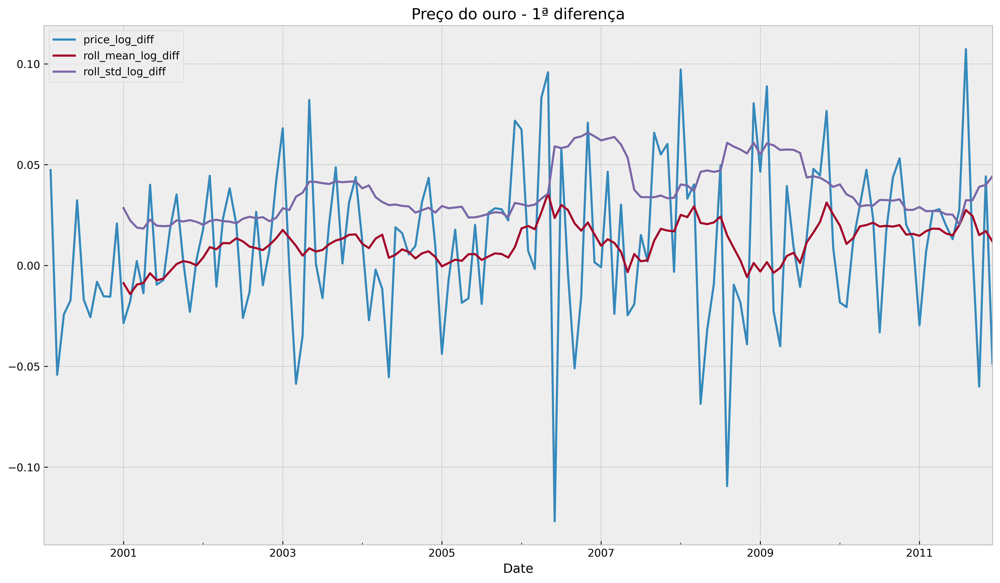

In [112]:
selected_columns = ['price_log_diff', 'roll_mean_log_diff', 'roll_std_log_diff']

df['price_log_diff'] = df.price_log.diff()
df['roll_mean_log_diff'] = df.price_log_diff.rolling(window = WINDOW).mean()
df['roll_std_log_diff'] = df.price_log_diff.rolling(window = WINDOW).std()

df[selected_columns].plot(title = 'Preço do ouro - 1ª diferença')

plt.show()

Teste para checar se se tornou estacionária

ADF test statistic: -9.13 (p-val: 0.00)
KPSS test statistic: 0.37 (p-val: 0.09)


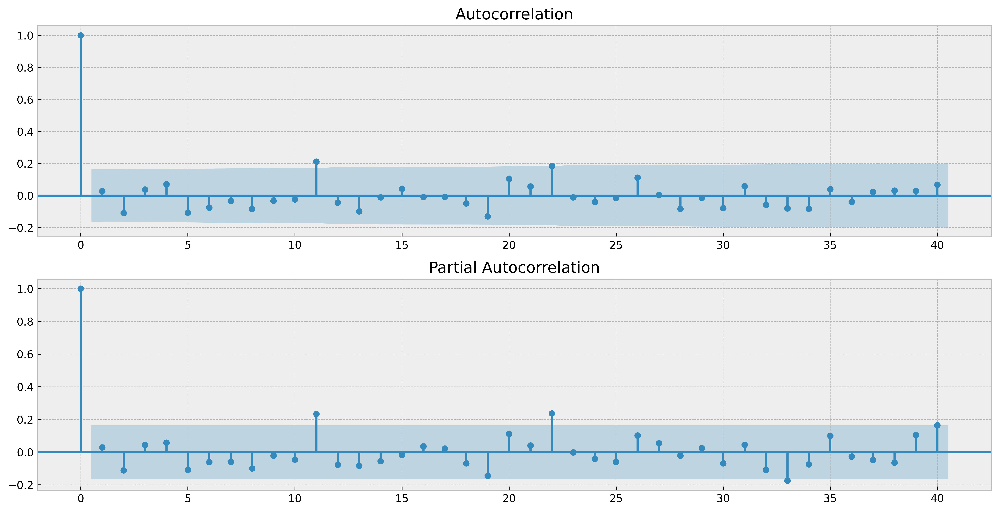

In [115]:
fig = test_autocorrelation(df.price_log_diff.dropna())

plt.show()

In [ ]:
Após aplicar a primeira diferença, a série se torna estacionária no nível de significância de 5%